In [31]:
import numpy as np
import pandas as pd
import pickle


1. First, we preview the BigToM dataset

In [2]:
new_bigtom = pd.read_csv("bigtom_story_scenarios.csv")
new_bigtom
# we can edit on top of this

,Story - Context,Story - Desire,Story - Perception cues,Story - Belief,Story - An external event,Percepts - Aware of event,Percepts - Not aware of event,Actions - Action given new state,Actions - Action given initial state,Questions - Belief Question,...,Answers - Belief Aware,Answers - Desire Aware,Answers - Action Aware,Answers - Belief not Aware,Answers - Desire not Aware,Answers - Action not Aware,Random Event,Percepts of R.E. - Aware of random event,Percepts of R.E. - not Aware of random event,21
0,Noor is working as a barista at a busy coffee ...,Noor wants to make a delicious cappuccino for...,Noor grabs a milk pitcher and fills it with o...,Noor believes that the milk pitcher contains ...,"A coworker, who didn't hear the customer's re...",Noor sees her coworker swapping the milk.,Noor does not see her coworker swapping the milk.,Noor opens the fridge again and reaches for th...,Noor makes the cappuccino using the milk in th...,Does Noor believe the milk pitcher contains oa...,...,Noor believes the milk pitcher contains almond...,Noor wants to make a cappuccino with oat milk.,Noor will open the fridge once again to take o...,Noor believes the milk pitcher contains oat milk.,Noor wants to make a cappuccino with oat milk.,Noor will make the cappuccino using the milk i...,A decorative mug falls from a shelf in the cof...,Noor sees the decorative mug falling from the ...,Noor does not see the decorative mug falling f...,auto;0
1,Zara is attending an art exhibition at a local...,Zara wants to learn more about a particular a...,The label next to the artwork states that the...,Zara believes that the painting is the work o...,"A gallery staff member, realizing there was a...",Zara reads the updated label carefully.,Zara does not read the updated label.,Zara looks for more information about the emer...,Zara looks for more information about the famo...,Does Zara believe the painting is the work of ...,...,Zara believes the painting is the work of an e...,Zara wants to learn more about the painting an...,Zara will look for more information about the ...,Zara believes the painting is the work of a fa...,Zara wants to learn more about the painting an...,Zara will look for more information about the ...,A gallery visitor accidentally spills a glass ...,Zara observes the water spill.,Zara does not observe the water spill.,auto;0
2,Carlos is a farmer in a small village in Mexic...,He wants to irrigate his crops by opening a w...,Carlos closed the valve the previous evening.,Carlos believes the valve is currently closed.,"During the night, heavy rainfall caused the r...",Carlos sees the flooded cornfield.,Carlos does not see the flooded cornfield.,Carlos calls his neighbour to ask them if they...,Carlos calls his neighbour to ask them if they...,Does Carlos believe the water valve is closed ...,...,Carlos believes the water valve is open.,Carlos wants to close the valve due to the flo...,Carlos will call his neighbour to ask them if ...,Carlos believes the water valve is closed.,Carlos wants to open the valve to irrigate his...,Carlos will call his neighbour to ask them if ...,A group of wild turkeys wanders into the cornf...,Carlos notices the wild turkeys in his field.,Carlos does not notice the wild turkeys in his...,auto;0
3,Kofi is a fisherman from a small village in Gh...,He wants to catch enough fish today to provid...,Kofi repaired his fishing net last night.,Kofi believes that his fishing net is in good...,"While Kofi is away from his boat, a group of ...",Kofi observes the monkeys damaging his fishing...,Kofi does not see the monkeys damaging his fis...,Kofi buys new repair equipment for fixing the ...,Kofi goes fishing with his net.,Does Kofi believe his fishing net is in good c...,...,Kofi believes his fishing net is torn apart.,Kofi wants to catch fish with his net in good ...,Kofi will buy new repair equipment for fixing ...,Kofi believes his fishing net is in good condi...,Kofi wants to catch fish with his net in good ...

2. Load essential libraries and define essential functions.

In [3]:
import json
import re
import sys
import time
import warnings
from random import sample

import openai
from openai import AzureOpenAI
import pandas as pd
# from tqdm import tqdm
import tiktoken
douglas_key = "insert_key_here" # this key does not work anymore

# Parameters
client = AzureOpenAI(
  azure_endpoint = "https://hkust.azure-api.net",
  api_version = "2024-06-01",
  api_key = douglas_key #put your api key here
)

# Function
def get_response(message, instruction):
    response = client.chat.completions.create(
		model = 'gpt-4',
        temperature = 1,
        messages = [
            {"role": "system", "content": instruction},
            {"role": "user", "content": message}
        ]
    )
    
    # print token usage
    print(response.usage)
    # return the response
    return response.choices[0].message.content
  
def LM_generation(prompt, max_tokens = 10, temperature = 0.1, model = "gpt-4", system_msg = None, msg_history = None):
    retry_attempt = 5
    retry_num = 0
    generation_success = False
    messages = []
    if system_msg is not None:
        messages.append({'role':'system', 'content': system_msg})
    if msg_history is not None:
        messages = msg_history
    messages.append({'role':'user', 'content':prompt})
    while retry_num < retry_attempt and not generation_success:
        try:
            gen = client.chat.completions.create(
                model = model,
                messages = messages,
                max_tokens = max_tokens,
                temperature = temperature,
            ) 
            generation_success = True
            input_tokens = gen.usage.prompt_tokens
            output_tokens = gen.usage.completion_tokens
        except openai.APIError as e:
            retry_num += 1
            generation_success = False
            time.sleep(5)
            # return "openai.error.APIError", -1, -1 
        except openai.RateLimitError as e:
            retry_num += 1
            generation_success = False
            time.sleep(30)
        except:
            retry_num += 1
            generation_success = False
            time.sleep(10)
    
    if generation_success:
        if gen == None or gen.choices[0] == None or gen.choices[0].message == None or gen.choices[0].message.content == None:
            return "", 0, 0
        return gen.choices[0].message.content.strip(), input_tokens, output_tokens
    else:
        return "Error", -1,-1

def count_tokens(text, encoding_name = "cl100k_base"):
    encoding = tiktoken.get_encoding(encoding_name)
    # print(text)
    num_tokens = len(encoding.encode(text))
    return num_tokens


3. Preview the Loaded Dataset

In [4]:

for col in new_bigtom.columns:
    print(col, " : ", new_bigtom.iloc[7][col])

Story - Context  :  Kael is a farmer in a remote village in the Andes.
Story - Desire  :   Kael wants to plant a new crop of high-altitude potatoes in one of his terraced fields.
Story - Perception cues  :   The soil in the field appears rich and well-fertilized.
Story - Belief  :   Kael believes that the soil is rich and well-fertilized.
Story - An external event  :   Overnight, heavy rainfall washes away much of the fertile soil, leaving mostly rocky dirt behind.
Percepts - Aware of event  :  Kael notices the change in the soil after the rainfall.
Percepts - Not aware of event  :  Kael does not notice the change in the soil after the rainfall.
Actions - Action given new state  :  Kael buys more fertilizer and compost for the soil.
Actions - Action given initial state  :  Kael plants the high-altitude potatoes in the field.
Questions - Belief Question  :  Does Kael believe the soil is rich and well-fertilized or mostly rocky dirt?
Questions - Desire Question  :  Does Kael want to plan

4. We create a list of names for all protagonists

In [4]:
protag_name = [new_bigtom.iloc[i]['Story - Context'].split()[0] for i in range(new_bigtom.shape[0])]

['Noor', 'Zara', 'Carlos', 'Kofi', 'Azola', 'Ravi', 'Kofi', 'Kael', 'Farhan', 'Abhay', 'Aniket', 'Lila', 'Kavi', 'Hiroshi', 'Juan', 'Mei', 'Juanita', 'Mei', 'Cheng', 'Jia', 'Isabela', 'Emeka', 'Luka', 'Amaury', 'Chi', 'Mei', 'Mei', 'Nia', 'Heiwa', 'Amina', 'Fatima', 'Fatima', 'Nneka', 'Fatima', 'Amina', 'Aiko', 'Carlos', 'Mateo', 'Miguel', 'Carlos', 'Carlos', 'Amara', 'Fatima', 'Fatima', 'Aisha', 'Amara', 'Juan', 'Hiroshi', 'Yoshi,', 'Takumi', 'Hiro', 'Tumelo', 'Kofi', 'Lila', 'Odette', 'Mei', 'Fatima', 'Kwame', 'Luka', 'Olumide,', 'Odion', 'Ibrahim', 'Rohan', 'Rohit', 'Kunal', 'Amara', 'Leilani', 'Amina', 'Amara,', 'Amina', 'Fatima', 'Mei', 'Yara', 'Isabella', 'Xia', 'Mei', 'Olabisi', 'Kalyani', 'Kavya', 'Amara', 'Naledi', 'Emilia', 'Mei', 'Emeka', 'Aria', 'Ailani', 'Takeshi', 'Ravi', 'Surya', 'Takeshi', 'Hiroshi', 'Kwame', 'Ngozi', 'Naledi', 'Lila', 'Amara', 'Mei,', 'Mei,', 'Jia', 'Enrique', 'Amara', 'Kwasi', 'Fatima', 'Kofi', 'Kofi', 'Amrita', 'Amina', 'Priya', 'Nkiru', 'Aisha', 'Ta

5. Generate Percept Cues

In [5]:
# process story
# given string input, return structuralized story 

def process(percept_text, senses, mode = 'default'):
    # given string input of story
    percept_text = percept_text.split('\n')  # format for each cue: 'cue name', 'cue 1', 'cue 2', blank.
    if mode == 'default':
        if len(percept_text) not in [4*len(senses)-1, 4*len(senses)]:
            print('process() not done correctly')
        return {senses[i]:[percept_text[4*i+1][3:], percept_text[4*i+2][3:]] for i in range(len(senses))}
    
    elif mode == 'random':
        if len(percept_text) not in [3*len(senses)-1, 3*len(senses)]:
            print('process() not done correctly')
        return {senses[i]:percept_text[3*i+1] for i in range(len(senses))}
        
    

In [7]:
#save

def save_list_of_dict(save_name, list_of_dict):
    with open(save_name, 'wb') as f:
        pickle.dump(list_of_dict, f)

def load_list_of_dict(save_name):
    with open(save_name, 'rb') as f:
        loaded = pickle.load(f)
    return loaded

We plan to only generate 100 stories:

In [ ]:
num_stories = 100

In [ ]:
# Generate Story Template
# i = 1
import time 
input_tokens = 0
output_tokens = 0

begin = time.time()
percept_processed = []

for i in range(num_stories): # skip 0 cuz we already did it. 
    print("Generating:", i, "-th prompt")
    prompt = f"Story: {new_bigtom.iloc[i]['Story - Context']} {new_bigtom.iloc[i]['Story - Desire']} {new_bigtom.iloc[i]['Story - Perception cues']}\n\n"
    prompt += f"Main character's belief: {new_bigtom.iloc[i]['Story - Belief']}\n\n"
    # prompt = f"Story: {new_bigtom.iloc[i]['Story - Context']} {new_bigtom.iloc[i]['Story - Desire']} {new_bigtom.iloc[i]['Story - Perception cues']} \n\n"
    prompt += f"Event: {new_bigtom.iloc[i]['Story - An external event']} \n\n"
    
    # prompt += f"Instructions: From this Story, generate 10 perceptual cues that {protag_name[i]} may notice about the Event. "
    # prompt += f"Each perceptual cue should continue the Story and Event. Write one sentence for each perceptual cue. "
    # prompt += f"Avoid descriptions of {protag_name[i]}\'s thoughts. Be systematic, reasonable, creative, and innovative, and make the stories diverse (from different contexts). "
    # prompt += f"Avoid making direct comparisons to the item mentioned in the event, but make vivid descriptions about the difference."
    
    # 
    #  visual, auditory, olfactory, gustatory, tactile, 
    prompt += "Instructions: Based on the following story and event, generate perceptual cues that the main character might encounter, "
    prompt += "which MUST challenge their belief. Each cue should be creative, reasonable, and systematically explore the sensory modalities of: visual, auditory, olfactory, gustatory, tactile, thermoception (sense of temperature about objects), proprioception (sense of body position/weight), social perception. "
    prompt += "Be descriptive and only make vivid descriptions about the perceptual cue, without describing the main character's thoughts. Avoid making explicit comparisons between the event and the main character's belief. Generate 2 perceptual cues for each sensory modality. "
    prompt += "Be super duper creative! "
    prompt += "Do not use these words: different, difference, instead of, contrasts.\n"
    prompt += "For each cue, write your output in a format like this example: \n"
    prompt += "### Visual Cues\n1. A bright green label on the milk carton nearby suddenly catches Noor’s eye, glistening under the café's overhead lights. The bold print reads “Almond Milk” in a slightly whimsical font, contrasting sharply with the soft beige of the oat milk packaging Noor is accustomed to seeing.\n 2. As Noor pours the milk into the espresso, she notices the liquid's texture. Instead of the familiar creamy, smooth flow that oat milk typically has, the milk appears slightly more translucent, with a thinner consistency that swirls differently in the cup, creating delicate, lacy patterns.\n\n"

    # prompt += 'Write your output in this template: “### <sense 1> Cues\n1. <perceptual cue (variable length)>\n2. <perceptual cue (variable length)>\n\n### <sense 2> Cues\n1. <perceptual cue (variable length)>\n2. <perceptual cue (variable length)>”'
    # prompt += "Here are some general examples of how perceptual cues should look like, for your reference: "
    # prompt += "1. Maria sees smoke coming from the kitchen, suggesting a fire. Should she change her belief about the kitchen being safe? "
    # prompt += "2. Lila smells gas in the garage, where she believes everything is secure. Should she change her belief about the safety of the garage? "
    
    # print("input tokens = ", count_tokens(prompt), ". price (USD) is ", count_tokens(prompt)*30/1000000)
    input_tokens += count_tokens(prompt)
    
    # print(prompt)
    for _ in range(1): # generate 3 outputs. 
        # print("iteration ")
        max_tokens = 1500
        output = LM_generation(prompt, temperature = 0.6, max_tokens = max_tokens, model = "gpt-4o-mini")
        # print(output)
        # put output into the percept_processed
        percept_processed.append(process(output[0], senses))
        output_tokens += count_tokens(output[0])
        if (count_tokens(output[0])>1200):
            print("Warning: long input")
        if (count_tokens(output[0])>max_tokens):
            print("Error: LLM didn't manage to finish. Plz check again")
        # print("output tokens = ", count_tokens(output[0]), ". price (USD) is ", count_tokens(output[0])*60/1000000)
        save_list_of_dict('saved_processed_percepts.pkl', percept_processed)
    
    if i % 5 == 0:
        save_list_of_dict(f'saved_processed_percepts_backup_v{i}.pkl', percept_processed) # for backup purpose
        end = time.time()
        print(f'Time taken for these 5 stories: {end-begin} seconds.')
        begin = time.time()


print("input tokens = ", input_tokens, ". price (USD) is ", input_tokens*30/1000000)
print("output tokens = ", output_tokens, ". price (USD) is ", output_tokens*60/1000000)





Generating: 78 -th prompt


In [125]:
senses = ['visual', 'auditory', 'olfactory', 'gustatory', 'tactile', 'thermo', 'proprio', 'social']
num_senses = len(senses)

In [94]:
# random stories

import time 
input_tokens = 0
output_tokens = 0

begin = time.time()
random_percepts = []

#for i in range(200): # skip 0 cuz we already did it. 
for i in range(num_stories):
    print("Generating:", i, "-th prompt")
    prompt = f"Story: {new_bigtom.iloc[i]['Story - Context']} {new_bigtom.iloc[i]['Story - Desire']} {new_bigtom.iloc[i]['Story - Perception cues']}\n\n"
    prompt += f"Main character's belief: {new_bigtom.iloc[i]['Story - Belief']}\n\n"
    # prompt = f"Story: {new_bigtom.iloc[i]['Story - Context']} {new_bigtom.iloc[i]['Story - Desire']} {new_bigtom.iloc[i]['Story - Perception cues']} \n\n"
    prompt += f"Random Event: {new_bigtom.iloc[i]['Random Event']} \n\n"
    
    # prompt += f"Instructions: From this Story, generate 10 perceptual cues that {protag_name[i]} may notice about the Event. "
    # prompt += f"Each perceptual cue should continue the Story and Event. Write one sentence for each perceptual cue. "
    # prompt += f"Avoid descriptions of {protag_name[i]}\'s thoughts. Be systematic, reasonable, creative, and innovative, and make the stories diverse (from different contexts). "
    # prompt += f"Avoid making direct comparisons to the item mentioned in the event, but make vivid descriptions about the difference."
    
    # 
    #  visual, auditory, olfactory, gustatory, tactile, 
    prompt += "Instructions: Based on the random event, generate perceptual cues that the main character might encounter. "
    prompt += "Each cue should be creative, reasonable, and systematically explore the sensory modalities of: visual, auditory, olfactory, gustatory, tactile, thermoception (sense of temperature about objects), proprioception (sense of body position/weight), social perception. "
    prompt += "Be descriptive and only make vivid descriptions about the perceptual cue, without describing the main character's thoughts. Avoid making explicit comparisons between the event and the main character's belief. Generate 1 perceptual cue for each sensory modality. "
    prompt += "Be super duper creative! "
    prompt += "Do not use these words: different, difference, instead of, contrasts.\n"
    prompt += "For each cue, write your output in a format like this example: \n"
    prompt += "### Visual Cues:\nA bright green label on the milk carton nearby suddenly catches Noor’s eye, glistening under the café's overhead lights. The bold print reads “Almond Milk” in a slightly whimsical font, contrasting sharply with the soft beige of the oat milk packaging Noor is accustomed to seeing.\n\n"

    # prompt += 'Write your output in this template: “### <sense 1> Cues\n1. <perceptual cue (variable length)>\n2. <perceptual cue (variable length)>\n\n### <sense 2> Cues\n1. <perceptual cue (variable length)>\n2. <perceptual cue (variable length)>”'
    # prompt += "Here are some general examples of how perceptual cues should look like, for your reference: "
    # prompt += "1. Maria sees smoke coming from the kitchen, suggesting a fire. Should she change her belief about the kitchen being safe? "
    # prompt += "2. Lila smells gas in the garage, where she believes everything is secure. Should she change her belief about the safety of the garage? "
    
    # print("input tokens = ", count_tokens(prompt), ". price (USD) is ", count_tokens(prompt)*30/1000000)
    input_tokens += count_tokens(prompt)
    
    # print(prompt)
    for _ in range(1): # generate 3 outputs. 
        # print("iteration ")
        output = LM_generation(prompt, temperature = 0.6, max_tokens = 1500, model = "gpt-4o-mini")
        # print(output)
        # put output into the random_percepts
        # print(prompt)
        random_percepts.append(process(output[0], senses, mode = 'random'))
        # print(output[0])
        # testing = output[0].split('\n')
        # print(testing[::3])
        # print(testing[1::3])
        # print(testing[2::3])
        # print(len(output[0].split('\n')))
        # print()
        # print(process(output[0], senses, mode = 'random'))
        output_tokens += count_tokens(output[0])
        if (count_tokens(output[0])>1200):
            print("Warning: long input")
        if (count_tokens(output[0])>1500):
            print("Error: LLM didn't manage to finish. Plz check again")
        # print("output tokens = ", count_tokens(output[0]), ". price (USD) is ", count_tokens(output[0])*60/1000000)
        save_list_of_dict('saved_random_percepts.pkl', random_percepts)
    
    if i % 5 == 0:
        save_list_of_dict(f'saved_random_percepts_backup_v{i}.pkl', random_percepts) # for backup purpose
        end = time.time()
        print(f'Time taken for these 5 stories: {end-begin} seconds.')
        begin = time.time()


print("input tokens = ", input_tokens, ". price (USD) is ", input_tokens*30/1000000)
print("output tokens = ", output_tokens, ". price (USD) is ", output_tokens*60/1000000)




Generating: 0 -th prompt
Time taken for these 5 stories: 4.4290549755096436 seconds.
Generating: 1 -th prompt
Generating: 2 -th prompt
Generating: 3 -th prompt
Generating: 4 -th prompt
Generating: 5 -th prompt
Time taken for these 5 stories: 26.716525077819824 seconds.
Generating: 6 -th prompt
Generating: 7 -th prompt
Generating: 8 -th prompt
Generating: 9 -th prompt
Generating: 10 -th prompt
Time taken for these 5 stories: 27.291361093521118 seconds.
Generating: 11 -th prompt
Generating: 12 -th prompt
Generating: 13 -th prompt
Generating: 14 -th prompt
Generating: 15 -th prompt
Time taken for these 5 stories: 28.626781940460205 seconds.
Generating: 16 -th prompt
Generating: 17 -th prompt
Generating: 18 -th prompt
Generating: 19 -th prompt
Generating: 20 -th prompt
Time taken for these 5 stories: 25.19908595085144 seconds.
Generating: 21 -th prompt
Generating: 22 -th prompt
Generating: 23 -th prompt
Generating: 24 -th prompt
Generating: 25 -th prompt
Time taken for these 5 stories: 33.

After saving the generated percept cues, I filtered and labelled these cues manually. Please refer to the file "labelled_processed_percepts.csv" for the processed percept cues. 

6. Load the processed percept cues

In [126]:
# Load labelled data
import math 
labelled_percepts = pd.read_csv("labelled_processed_percepts.csv")
labelled_percepts = labelled_percepts.transpose()
labelled_percepts.columns = labelled_percepts.iloc[0]
labelled_percepts = labelled_percepts.drop(labelled_percepts.index[0])
for _ in range(3): # discard useless stuff
    labelled_percepts = labelled_percepts.drop(labelled_percepts.index[num_stories])
labelled_percepts = labelled_percepts.drop(columns = ['story'])
labelled_percepts = labelled_percepts.dropna(axis=1, how='all')

positives_cols = labelled_percepts.keys()[::2]
hard_negatives_cols = labelled_percepts.keys()[1::2]

positives = [ {col.split('_')[0]: labelled_percepts.iloc[story_id][col]  for col in positives_cols} for story_id in range(num_stories)]
hard_negatives = [ {col.split('_')[0]: labelled_percepts.iloc[story_id][col]  for col in hard_negatives_cols} for story_id in range(num_stories)]

In [11]:
easy_negatives = load_list_of_dict('saved_random_percepts.pkl')
print(easy_negatives)
len(easy_negatives)

[{'visual': 'A vibrant splash of color erupts as the decorative mug tumbles from the shelf, spinning through the air. Its intricate floral patterns swirl in a kaleidoscope of reds and yellows, catching the attention of nearby customers as it arcs gracefully before crashing onto the tiled floor, shards scattering like confetti.', 'auditory': 'A sharp, echoing clatter reverberates through the coffee shop, the sound of ceramic meeting tile ringing out like a sudden alarm. The gasp of a nearby customer follows, punctuated by the soft chatter of patrons momentarily pausing to witness the commotion, creating a symphony of surprise and intrigue.', 'olfactory': 'As the mug shatters, a waft of freshly ground coffee beans mingles with the scent of warm pastries from the bakery case. The rich aroma envelops Noor, intertwining with the faint, nutty sweetness of the oat milk, creating an inviting yet chaotic olfactory landscape.', 'gustatory': 'The taste of the air shifts as a hint of spilled coffe

100

Analyze the situation and answer the following question: Before the event, {Story - Initial Belief}. After the event, based on the new information or experience, does {protagonist_name} maintain this initial belief?

In [13]:
# For simple processing:
sense_dict = {senses[i]:i for i in range(num_senses)}


{'visual': 0, 'auditory': 1, 'olfactory': 2, 'gustatory': 3, 'tactile': 4, 'thermo': 5, 'proprio': 6, 'social': 7}


7. Performing Task 1

In [41]:
positives_correct = np.zeros((num_stories, num_senses)) #[story_id, sense]
positives_total = np.zeros((num_stories, num_senses)) # indicates which questions exist

In [42]:
# positives
count = 0
input_tokens = 0
output_tokens = 0
begin = time.time()


for i in range(num_stories): # set to 100 later
    print(f'{i}-th story')
    for col in positives[i].keys():
        if str(positives[i][col]) == 'nan':
            continue
        count += 1
        for k in range(2): # pos/neg
            print("Generating:", count, "-th prompt")
            # prompt = f"Story: {new_bigtom.iloc[i]['Story - Context']} {new_bigtom.iloc[i]['Story - Desire']} {new_bigtom.iloc[i]['Story - Perception cues']} {new_bigtom.iloc[i]['Story - Belief']}\n\n"
            prompt = f"Story: {new_bigtom.iloc[i]['Story - Context']} {new_bigtom.iloc[i]['Story - Desire']} {new_bigtom.iloc[i]['Story - Perception cues']} \n\n"
            prompt += f"Event: {new_bigtom.iloc[i]['Story - An external event']}\n\n"
            prompt += f"Regarding the event, the main character {protag_name[i]} only encounters the following percept: {positives[i][col]}\n\n"
            # prompt += f"Instructions: Select the most appropriate answer to the following question: "
            # prompt += f"before the event, {protag_name[i]}'s initial belief was {new_bigtom.iloc[i]['Story - Belief']}. "
            # prompt += f"Does {protag_name[i]} maintain this initial belief after the event? Answer 'Yes' or 'No':\n\n"
            # prompt += f"A. {protag_name[i]} maintains their initial belief \nB. {protag_name[i]} changes their belief \n"
            # prompt += f"before the event, {protag_name[i]}\'s belief was \"{new_bigtom.iloc[i]['Story - Belief']}\". "
            # prompt += f"Did the event cause {protag_name[i]} to change this belief? \n"
            # prompt += f"Answers: A. No \nB. Yes"
            # prompt += f"Based on the story and the event, choose the answer option that best describes {protag_name[i]}\'s belief AFTER the event: \n"
            # prompt += f"A. {new_bigtom.iloc[i]['Story - Belief']} \n"
            # prompt += f"B. {new_bigtom.iloc[i]['Story - Belief']}"
            
            
            prompt += f"Before the event, the main character's initial belief was {new_bigtom.iloc[i]['Story - Belief']} "
            prompt += f"Instructions: Analyze the situation and select the most appropriate answer to the following question: "

            prompt += f"After the event happened, based on the main character's perception of the event, is the following statement about {protag_name[i]}'s belief True or False: \n"
            prompt += f"Statement: \"{new_bigtom.iloc[i]['Story - Belief']}\""
            if k == 0:
                prompt += f"A. True\nB. False"
            elif k == 1:
                prompt += f"A. False\nB. True"              

            input_tokens += count_tokens(prompt)
            # print("input tokens = ", count_tokens(prompt), ". price (USD) is ", count_tokens(prompt)*30/1000000)
            print(prompt)
            for _ in range(1): # generate 3 outputs. 
                print("iteration ")
                output = LM_generation(prompt, temperature = 0, max_tokens = 3, model = "gpt-4")
                print('output: ', output)
                model_answer = output[0][0]
                if k == 0:
                    actual_answer = 'B' # positives
                    # actual_answer = 'A' # negatives
                elif k == 1:
                    actual_answer = 'A' # positives
                    # actual_answer = 'B' # negatives
                    
                
                positives_total[i, sense_dict[col]] += 1
                positives_correct[i, sense_dict[col]] += int(model_answer == actual_answer)
                
                output_tokens += count_tokens(output[0])
                np.save('positives_correct.npy', positives_correct)
                np.save('positives_total.npy', positives_total)
                # print("output tokens = ", count_tokens(output[0]), ". price (USD) is ", count_tokens(output[0])*60/1000000)
                
    if i % 5 == 0:
        end = time.time()
        print(f'Time taken for these 5 stories: {end-begin} seconds.')
        begin = time.time()


print("input tokens = ", input_tokens, ". price (USD) is ", input_tokens*30/1000000)
print("output tokens = ", output_tokens, ". price (USD) is ", output_tokens*60/1000000)

print('Number of Questions: ', positives_total.sum())
print('Number of Questions (Sanity Check): ', 2*count)
print('accuracy: ', positives_correct.sum()/positives_total.sum())



0-th story
Generating: 1 -th prompt
Story: Noor is working as a barista at a busy coffee shop.  Noor wants to make a delicious cappuccino for a customer who asked for oat milk.  Noor grabs a milk pitcher and fills it with oat milk. 

Event:  A coworker, who didn't hear the customer's request, swaps the oat milk in the pitcher with almond milk while Noor is attending to another task.

Regarding the event, the main character Noor only encounters the following percept: As Noor pours the milk into the espresso, she notices the liquid's texture. Instead of the familiar creamy, smooth flow that oat milk typically has, the milk appears slightly more translucent, with a thinner consistency that swirls differently in the cup, creating delicate, lacy patterns.

Before the event, the main character's initial belief was  Noor believes that the milk pitcher contains oatmilk. Instructions: Analyze the situation and select the most appropriate answer to the following question: After the event happene

In [43]:
alt_positives_correct = np.zeros((num_stories,num_senses))
alt_positives_total = np.zeros((num_stories,num_senses))

In [44]:
# positives
count = 0
input_tokens = 0
output_tokens = 0
begin = time.time()


for i in range(num_stories): # set to 100 later
    print(f'{i}-th story')
    for col in positives[i].keys():
        if str(positives[i][col]) == 'nan':
            continue
        count += 1
        for k in range(2): # pos/neg
            print("Generating:", count, "-th prompt")
            # prompt = f"Story: {new_bigtom.iloc[i]['Story - Context']} {new_bigtom.iloc[i]['Story - Desire']} {new_bigtom.iloc[i]['Story - Perception cues']} {new_bigtom.iloc[i]['Story - Belief']}\n\n"
            prompt = f"Story: {new_bigtom.iloc[i]['Story - Context']} {new_bigtom.iloc[i]['Story - Desire']} {new_bigtom.iloc[i]['Story - Perception cues']} \n\n"
            prompt += f"Event: {new_bigtom.iloc[i]['Story - An external event']}\n\n"
            prompt += f"Regarding the event, the main character {protag_name[i]} only encounters the following percept: {positives[i][col]}\n\n"
            # prompt += f"Instructions: Select the most appropriate answer to the following question: "
            # prompt += f"before the event, {protag_name[i]}'s initial belief was {new_bigtom.iloc[i]['Story - Belief']}. "
            # prompt += f"Does {protag_name[i]} maintain this initial belief after the event? Answer 'Yes' or 'No':\n\n"
            # prompt += f"A. {protag_name[i]} maintains their initial belief \nB. {protag_name[i]} changes their belief \n"
            # prompt += f"before the event, {protag_name[i]}\'s belief was \"{new_bigtom.iloc[i]['Story - Belief']}\". "
            # prompt += f"Did the event cause {protag_name[i]} to change this belief? \n"
            # prompt += f"Answers: A. No \nB. Yes"
            # prompt += f"Based on the story and the event, choose the answer option that best describes {protag_name[i]}\'s belief AFTER the event: \n"
            # prompt += f"A. {new_bigtom.iloc[i]['Story - Belief']} \n"
            # prompt += f"B. {new_bigtom.iloc[i]['Story - Belief']}"
            
            
            prompt += f"Before the event, the main character's initial belief was {new_bigtom.iloc[i]['Story - Belief']} "
            prompt += f"Instructions: Analyze the situation and select the most appropriate answer to the following question: "
            prompt += f"Did the event cause the main character {protag_name[i]} to change their belief?"
            if k == 0:
                prompt += f"A. No\nB. Yes"
            elif k == 1:
                prompt += f"A. Yes\nB. No"              

            input_tokens += count_tokens(prompt)
            # print("input tokens = ", count_tokens(prompt), ". price (USD) is ", count_tokens(prompt)*30/1000000)
            print(prompt)
            for _ in range(1): # generate 3 outputs. 
                print("iteration ")
                output = LM_generation(prompt, temperature = 0, max_tokens = 3, model = "gpt-4")
                print('output: ', output)
                model_answer = output[0][0]
                if k == 0:
                    actual_answer = 'B' # positives
                    # actual_answer = 'A' # negatives
                elif k == 1:
                    actual_answer = 'A' # positives
                    # actual_answer = 'B' # negatives
                    
                
                alt_positives_total[i, sense_dict[col]] += 1
                alt_positives_correct[i, sense_dict[col]] += int(model_answer == actual_answer)
                
                output_tokens += count_tokens(output[0])
                np.save('alt_positives_correct.npy', alt_positives_correct)
                np.save('alt_positives_total.npy', alt_positives_total)
                # print("output tokens = ", count_tokens(output[0]), ". price (USD) is ", count_tokens(output[0])*60/1000000)
                
    if i % 5 == 0:
        end = time.time()
        print(f'Time taken for these 5 stories: {end-begin} seconds.')
        begin = time.time()


print("input tokens = ", input_tokens, ". price (USD) is ", input_tokens*30/1000000)
print("output tokens = ", output_tokens, ". price (USD) is ", output_tokens*60/1000000)

print('Number of Questions: ', alt_positives_total.sum())
print('Number of Questions (Sanity Check): ', 2*count)
print('accuracy: ', alt_positives_correct.sum()/alt_positives_total.sum())



0-th story
Generating: 1 -th prompt
Story: Noor is working as a barista at a busy coffee shop.  Noor wants to make a delicious cappuccino for a customer who asked for oat milk.  Noor grabs a milk pitcher and fills it with oat milk. 

Event:  A coworker, who didn't hear the customer's request, swaps the oat milk in the pitcher with almond milk while Noor is attending to another task.

Regarding the event, the main character Noor only encounters the following percept: As Noor pours the milk into the espresso, she notices the liquid's texture. Instead of the familiar creamy, smooth flow that oat milk typically has, the milk appears slightly more translucent, with a thinner consistency that swirls differently in the cup, creating delicate, lacy patterns.

Before the event, the main character's initial belief was  Noor believes that the milk pitcher contains oatmilk. Instructions: Analyze the situation and select the most appropriate answer to the following question: Did the event cause the

In [33]:
# initialize - DO NOT touch. 
hard_negatives_correct = np.zeros((num_stories, num_senses)) #[story_id, sense]
hard_negatives_total = np.zeros((num_stories, num_senses)) # indicates which questions exist



In [34]:
# hard negatives
count = 0
input_tokens = 0
output_tokens = 0
begin = time.time()


for i in range(num_stories): # set to 100 later
    print(f'{i}-th story')
    for col in hard_negatives[i].keys():
        if str(hard_negatives[i][col]) == 'nan':
            continue
        count += 1
        for k in range(2): # pos/neg
            print("Generating:", count, "-th prompt")
            # prompt = f"Story: {new_bigtom.iloc[i]['Story - Context']} {new_bigtom.iloc[i]['Story - Desire']} {new_bigtom.iloc[i]['Story - Perception cues']} {new_bigtom.iloc[i]['Story - Belief']}\n\n"
            prompt = f"Story: {new_bigtom.iloc[i]['Story - Context']} {new_bigtom.iloc[i]['Story - Desire']} {new_bigtom.iloc[i]['Story - Perception cues']} \n\n"
            prompt += f"Event: {new_bigtom.iloc[i]['Story - An external event']}\n\n"
            prompt += f"Regarding the event, the main character {protag_name[i]} only encounters the following percept, and nothing else: {hard_negatives[i][col]}\n\n"
            # prompt += f"Instructions: Select the most appropriate answer to the following question: "
            # prompt += f"before the event, {protag_name[i]}'s initial belief was {new_bigtom.iloc[i]['Story - Belief']}. "
            # prompt += f"Does {protag_name[i]} maintain this initial belief after the event? Answer 'Yes' or 'No':\n\n"
            # prompt += f"A. {protag_name[i]} maintains their initial belief \nB. {protag_name[i]} changes their belief \n"
            # prompt += f"before the event, {protag_name[i]}\'s belief was \"{new_bigtom.iloc[i]['Story - Belief']}\". "
            # prompt += f"Did the event cause {protag_name[i]} to change this belief? \n"
            # prompt += f"Answers: A. No \nB. Yes"
            # prompt += f"Based on the story and the event, choose the answer option that best describes {protag_name[i]}\'s belief AFTER the event: \n"
            # prompt += f"A. {new_bigtom.iloc[i]['Story - Belief']} \n"
            # prompt += f"B. {new_bigtom.iloc[i]['Story - Belief']}"
            
            
            prompt += f"Before the event, the main character's initial belief was {new_bigtom.iloc[i]['Story - Belief']} "
            prompt += f"Instructions: Analyze the situation and select the most appropriate answer to the following question: "

            prompt += f"After the event happened, based on the main character's perception of the event, is the following statement about {protag_name[i]}'s belief True or False: \n"
            prompt += f"Statement: \"{new_bigtom.iloc[i]['Story - Belief']}\""
            if k == 0:
                prompt += f"A. True\nB. False"
            else:
                prompt += f"A. False\nB. True"              

            input_tokens += count_tokens(prompt)
            # print("input tokens = ", count_tokens(prompt), ". price (USD) is ", count_tokens(prompt)*30/1000000)
            print(prompt)
            for _ in range(1): # generate 3 outputs. 
                print("iteration ")
                output = LM_generation(prompt, temperature = 0, max_tokens = 3, model = "gpt-4")
                print('output: ', output)
                model_answer = output[0][0]
                if k == 0:
                    # actual_answer = 'B' # positives
                    actual_answer = 'A' # negatives
                else:
                    # actual_answer = 'A' # positives
                    actual_answer = 'B' # negatives
                    
                
                hard_negatives_total[i, sense_dict[col]] += 1
                hard_negatives_correct[i, sense_dict[col]] += int(model_answer == actual_answer)
                
                output_tokens += count_tokens(output[0])
                np.save('hard_negatives_correct.npy', hard_negatives_correct)
                np.save('hard_negatives_total.npy', hard_negatives_total)
                # print("output tokens = ", count_tokens(output[0]), ". price (USD) is ", count_tokens(output[0])*60/1000000)
                
    if i % 5 == 0:
        end = time.time()
        print(f'Time taken for these 5 stories: {end-begin} seconds.')
        begin = time.time()


print("input tokens = ", input_tokens, ". price (USD) is ", input_tokens*30/1000000)
print("output tokens = ", output_tokens, ". price (USD) is ", output_tokens*60/1000000)

print('Number of Questions: ', hard_negatives_total.sum())
print('Number of Questions (Sanity Check): ', 2*count)
print('accuracy: ', hard_negatives_correct.sum()/hard_negatives_total.sum())



0-th story
Generating: 1 -th prompt
Story: Noor is working as a barista at a busy coffee shop.  Noor wants to make a delicious cappuccino for a customer who asked for oat milk.  Noor grabs a milk pitcher and fills it with oat milk. 

Event:  A coworker, who didn't hear the customer's request, swaps the oat milk in the pitcher with almond milk while Noor is attending to another task.

Regarding the event, the main character Noor only encounters the following percept, and nothing else: A bright green label on the milk carton nearby suddenly catches Noor’s eye, glistening under the café's overhead lights. The bold print reads “Almond Milk” in a slightly whimsical font.

Before the event, the main character's initial belief was  Noor believes that the milk pitcher contains oatmilk. Instructions: Analyze the situation and select the most appropriate answer to the following question: After the event happened, based on the main character's perception of the event, is the following statement a

In [35]:
alt_hard_negatives_correct = np.zeros((num_stories, num_senses)) #[story_id, sense]
alt_hard_negatives_total = np.zeros((num_stories, num_senses)) # indicates which questions exist

In [36]:
# alt_hard_negatives
count = 0
input_tokens = 0
output_tokens = 0
begin = time.time()


for i in range(num_stories): # set to 100 later
    print(f'{i}-th story')
    for col in hard_negatives[i].keys():
        if str(hard_negatives[i][col]) == 'nan':
            continue
        count += 1
        for k in range(2): # pos/neg
            print("Generating:", count, "-th prompt")
            # prompt = f"Story: {new_bigtom.iloc[i]['Story - Context']} {new_bigtom.iloc[i]['Story - Desire']} {new_bigtom.iloc[i]['Story - Perception cues']} {new_bigtom.iloc[i]['Story - Belief']}\n\n"
            prompt = f"Story: {new_bigtom.iloc[i]['Story - Context']} {new_bigtom.iloc[i]['Story - Desire']} {new_bigtom.iloc[i]['Story - Perception cues']} \n\n"
            prompt += f"Event: {new_bigtom.iloc[i]['Story - An external event']}\n\n"
            prompt += f"Regarding the event, the main character {protag_name[i]} only encounters the following percept, and nothing else: {hard_negatives[i][col]}\n\n"
            # prompt += f"Instructions: Select the most appropriate answer to the following question: "
            # prompt += f"before the event, {protag_name[i]}'s initial belief was {new_bigtom.iloc[i]['Story - Belief']}. "
            # prompt += f"Does {protag_name[i]} maintain this initial belief after the event? Answer 'Yes' or 'No':\n\n"
            # prompt += f"A. {protag_name[i]} maintains their initial belief \nB. {protag_name[i]} changes their belief \n"
            # prompt += f"before the event, {protag_name[i]}\'s belief was \"{new_bigtom.iloc[i]['Story - Belief']}\". "
            # prompt += f"Did the event cause {protag_name[i]} to change this belief? \n"
            # prompt += f"Answers: A. No \nB. Yes"
            # prompt += f"Based on the story and the event, choose the answer option that best describes {protag_name[i]}\'s belief AFTER the event: \n"
            # prompt += f"A. {new_bigtom.iloc[i]['Story - Belief']} \n"
            # prompt += f"B. {new_bigtom.iloc[i]['Story - Belief']}"
            
            
            prompt += f"Before the event, the main character's initial belief was {new_bigtom.iloc[i]['Story - Belief']} "
            prompt += f"Instructions: Analyze the situation and select the most appropriate answer to the following question: "
            prompt += f"Did the event cause the main character {protag_name[i]} to change their belief?"
            if k == 0:
                prompt += f"A. No\nB. Yes"
            elif k == 1:
                prompt += f"A. Yes\nB. No"              

            input_tokens += count_tokens(prompt)
            # print("input tokens = ", count_tokens(prompt), ". price (USD) is ", count_tokens(prompt)*30/1000000)
            print(prompt)
            for _ in range(1): # generate 3 outputs. 
                print("iteration ")
                output = LM_generation(prompt, temperature = 0, max_tokens = 3, model = "gpt-4")
                print('output: ', output)
                model_answer = output[0][0]
                if k == 0:
                    # actual_answer = 'B' # positives
                    actual_answer = 'A' # negatives
                elif k == 1:
                    # actual_answer = 'A' # positives
                    actual_answer = 'B' # negatives
                    
                
                alt_hard_negatives_total[i, sense_dict[col]] += 1
                alt_hard_negatives_correct[i, sense_dict[col]] += int(model_answer == actual_answer)
                
                output_tokens += count_tokens(output[0])
                np.save('alt_hard_negatives_correct.npy', alt_hard_negatives_correct)
                np.save('alt_hard_negatives_total.npy', alt_hard_negatives_total)
                # print("output tokens = ", count_tokens(output[0]), ". price (USD) is ", count_tokens(output[0])*60/1000000)
                
    if i % 5 == 0:
        end = time.time()
        print(f'Time taken for these 5 stories: {end-begin} seconds.')
        begin = time.time()


print("input tokens = ", input_tokens, ". price (USD) is ", input_tokens*30/1000000)
print("output tokens = ", output_tokens, ". price (USD) is ", output_tokens*60/1000000)

print('Number of Questions: ', alt_hard_negatives_total.sum())
print('Number of Questions (Sanity Check): ', 2*count)
print('accuracy: ', alt_hard_negatives_correct.sum()/alt_hard_negatives_total.sum())



0-th story
Generating: 1 -th prompt
Story: Noor is working as a barista at a busy coffee shop.  Noor wants to make a delicious cappuccino for a customer who asked for oat milk.  Noor grabs a milk pitcher and fills it with oat milk. 

Event:  A coworker, who didn't hear the customer's request, swaps the oat milk in the pitcher with almond milk while Noor is attending to another task.

Regarding the event, the main character Noor only encounters the following percept, and nothing else: A bright green label on the milk carton nearby suddenly catches Noor’s eye, glistening under the café's overhead lights. The bold print reads “Almond Milk” in a slightly whimsical font.

Before the event, the main character's initial belief was  Noor believes that the milk pitcher contains oatmilk. Instructions: Analyze the situation and select the most appropriate answer to the following question: Did the event cause the main character Noor to change their belief?A. No
B. Yes
iteration 
output:  ('B. Yes'

In [104]:
easy_negatives_correct = np.zeros((num_stories, num_senses)) #[story_id, sense]
easy_negatives_total = np.zeros((num_stories, num_senses)) # indicates which questions exist



In [106]:
# easy negatives
count = 0
input_tokens = 0
output_tokens = 0
begin = time.time()


# for i in range(100): # set to 100 later
for i in range(num_stories):
    print(f'{i}-th story')
    for col in easy_negatives[i].keys():
        if str(easy_negatives[i][col]) == 'nan':
            continue
        count += 1
        for k in range(2): # pos/neg
            print("Generating:", count, "-th prompt")
            # prompt = f"Story: {new_bigtom.iloc[i]['Story - Context']} {new_bigtom.iloc[i]['Story - Desire']} {new_bigtom.iloc[i]['Story - Perception cues']} {new_bigtom.iloc[i]['Story - Belief']}\n\n"
            prompt = f"Story: {new_bigtom.iloc[i]['Story - Context']} {new_bigtom.iloc[i]['Story - Desire']} {new_bigtom.iloc[i]['Story - Perception cues']} \n\n"
            prompt += f"Event: {new_bigtom.iloc[i]['Story - An external event']}\n\n"
            prompt += f"Regarding the event, the main character {protag_name[i]} only encounters the following percept, and nothing else: {easy_negatives[i][col]}\n\n"
            # prompt += f"Instructions: Select the most appropriate answer to the following question: "
            # prompt += f"before the event, {protag_name[i]}'s initial belief was {new_bigtom.iloc[i]['Story - Belief']}. "
            # prompt += f"Does {protag_name[i]} maintain this initial belief after the event? Answer 'Yes' or 'No':\n\n"
            # prompt += f"A. {protag_name[i]} maintains their initial belief \nB. {protag_name[i]} changes their belief \n"
            # prompt += f"before the event, {protag_name[i]}\'s belief was \"{new_bigtom.iloc[i]['Story - Belief']}\". "
            # prompt += f"Did the event cause {protag_name[i]} to change this belief? \n"
            # prompt += f"Answers: A. No \nB. Yes"
            # prompt += f"Based on the story and the event, choose the answer option that best describes {protag_name[i]}\'s belief AFTER the event: \n"
            # prompt += f"A. {new_bigtom.iloc[i]['Story - Belief']} \n"
            # prompt += f"B. {new_bigtom.iloc[i]['Story - Belief']}"
            
            
            prompt += f"Before the event, the main character's initial belief was {new_bigtom.iloc[i]['Story - Belief']} "
            prompt += f"Instructions: Analyze the situation and select the most appropriate answer to the following question: "

            prompt += f"After the event happened, based on the main character's perception of the event, is the following statement about {protag_name[i]}'s belief True or False: \n"
            prompt += f"Statement: \"{new_bigtom.iloc[i]['Story - Belief']}\""
            if k == 0:
                prompt += f"A. True\nB. False"
            else:
                prompt += f"A. False\nB. True"              

            input_tokens += count_tokens(prompt)
            # print("input tokens = ", count_tokens(prompt), ". price (USD) is ", count_tokens(prompt)*30/1000000)
            print(prompt)
            for _ in range(1): # generate 3 outputs. 
                print("iteration ")
                output = LM_generation(prompt, temperature = 0, max_tokens = 3, model = "gpt-4")
                print('output: ', output)
                model_answer = output[0][0]
                if k == 0:
                    # actual_answer = 'B' # positives
                    actual_answer = 'A' # negatives
                else:
                    # actual_answer = 'A' # positives
                    actual_answer = 'B' # negatives
                    
                
                easy_negatives_total[i, sense_dict[col]] += 1
                easy_negatives_correct[i, sense_dict[col]] += int(model_answer == actual_answer)
                
                output_tokens += count_tokens(output[0])
                np.save('easy_negatives_correct.npy', easy_negatives_correct)
                np.save('easy_negatives_total.npy', easy_negatives_total)
                # print("output tokens = ", count_tokens(output[0]), ". price (USD) is ", count_tokens(output[0])*60/1000000)
                
    if i % 5 == 0:
        end = time.time()
        print(f'Time taken for these 5 stories: {end-begin} seconds.')
        begin = time.time()


print("input tokens = ", input_tokens, ". price (USD) is ", input_tokens*30/1000000)
print("output tokens = ", output_tokens, ". price (USD) is ", output_tokens*60/1000000)

print('Number of Questions: ', easy_negatives_total.sum())
print('Number of Questions (Sanity Check): ', 2*count)
print('accuracy: ', easy_negatives_correct.sum()/easy_negatives_total.sum())



0-th story
Generating: 1 -th prompt
Story: Noor is working as a barista at a busy coffee shop.  Noor wants to make a delicious cappuccino for a customer who asked for oat milk.  Noor grabs a milk pitcher and fills it with oat milk. 

Event:  A coworker, who didn't hear the customer's request, swaps the oat milk in the pitcher with almond milk while Noor is attending to another task.

Regarding the event, the main character Noor only encounters the following percept, and nothing else: A vibrant splash of color erupts as the decorative mug tumbles from the shelf, spinning through the air. Its intricate floral patterns swirl in a kaleidoscope of reds and yellows, catching the attention of nearby customers as it arcs gracefully before crashing onto the tiled floor, shards scattering like confetti.

Before the event, the main character's initial belief was  Noor believes that the milk pitcher contains oatmilk. Instructions: Analyze the situation and select the most appropriate answer to the

In [12]:
alt_easy_negatives_correct = np.zeros((num_stories, num_senses)) #[story_id, sense]
alt_easy_negatives_total = np.zeros((num_stories, num_senses)) # indicates which questions exist



In [13]:
# alt_easy_negatives
count = 0
input_tokens = 0
output_tokens = 0
begin = time.time()


for i in range(num_stories): # set to 100 later
    print(f'{i}-th story')
    for col in easy_negatives[i].keys():
        if str(easy_negatives[i][col]) == 'nan':
            continue
        count += 1
        for k in range(2): # pos/neg
            print("Generating:", count, "-th prompt")
            # prompt = f"Story: {new_bigtom.iloc[i]['Story - Context']} {new_bigtom.iloc[i]['Story - Desire']} {new_bigtom.iloc[i]['Story - Perception cues']} {new_bigtom.iloc[i]['Story - Belief']}\n\n"
            prompt = f"Story: {new_bigtom.iloc[i]['Story - Context']} {new_bigtom.iloc[i]['Story - Desire']} {new_bigtom.iloc[i]['Story - Perception cues']} \n\n"
            prompt += f"Event: {new_bigtom.iloc[i]['Story - An external event']}\n\n"
            prompt += f"Regarding the event, the main character {protag_name[i]} only encounters the following percept, and nothing else: {easy_negatives[i][col]}\n\n"
            # prompt += f"Instructions: Select the most appropriate answer to the following question: "
            # prompt += f"before the event, {protag_name[i]}'s initial belief was {new_bigtom.iloc[i]['Story - Belief']}. "
            # prompt += f"Does {protag_name[i]} maintain this initial belief after the event? Answer 'Yes' or 'No':\n\n"
            # prompt += f"A. {protag_name[i]} maintains their initial belief \nB. {protag_name[i]} changes their belief \n"
            # prompt += f"before the event, {protag_name[i]}\'s belief was \"{new_bigtom.iloc[i]['Story - Belief']}\". "
            # prompt += f"Did the event cause {protag_name[i]} to change this belief? \n"
            # prompt += f"Answers: A. No \nB. Yes"
            # prompt += f"Based on the story and the event, choose the answer option that best describes {protag_name[i]}\'s belief AFTER the event: \n"
            # prompt += f"A. {new_bigtom.iloc[i]['Story - Belief']} \n"
            # prompt += f"B. {new_bigtom.iloc[i]['Story - Belief']}"
            
            
            prompt += f"Before the event, the main character's initial belief was {new_bigtom.iloc[i]['Story - Belief']} "
            prompt += f"Instructions: Analyze the situation and select the most appropriate answer to the following question: "
            prompt += f"Did the event cause the main character {protag_name[i]} to change their belief?"
            if k == 0:
                prompt += f"A. No\nB. Yes"
            elif k == 1:
                prompt += f"A. Yes\nB. No"              

            input_tokens += count_tokens(prompt)
            # print("input tokens = ", count_tokens(prompt), ". price (USD) is ", count_tokens(prompt)*30/1000000)
            print(prompt)
            for _ in range(1): # generate 3 outputs. 
                print("iteration ")
                output = LM_generation(prompt, temperature = 0, max_tokens = 3, model = "gpt-4")
                print('output: ', output)
                model_answer = output[0][0]
                if k == 0:
                    # actual_answer = 'B' # positives
                    actual_answer = 'A' # negatives
                elif k == 1:
                    # actual_answer = 'A' # positives
                    actual_answer = 'B' # negatives
                    
                
                alt_easy_negatives_total[i, sense_dict[col]] += 1
                alt_easy_negatives_correct[i, sense_dict[col]] += int(model_answer == actual_answer)
                
                output_tokens += count_tokens(output[0])
                np.save('alt_easy_negatives_correct.npy', alt_easy_negatives_correct)
                np.save('alt_easy_negatives_total.npy', alt_easy_negatives_total)
                # print("output tokens = ", count_tokens(output[0]), ". price (USD) is ", count_tokens(output[0])*60/1000000)
                
    if i % 5 == 0:
        end = time.time()
        print(f'Time taken for these 5 stories: {end-begin} seconds.')
        begin = time.time()


print("input tokens = ", input_tokens, ". price (USD) is ", input_tokens*30/1000000)
print("output tokens = ", output_tokens, ". price (USD) is ", output_tokens*60/1000000)

print('Number of Questions: ', alt_easy_negatives_total.sum())
print('Number of Questions (Sanity Check): ', 2*count)
print('accuracy: ', alt_easy_negatives_correct.sum()/alt_easy_negatives_total.sum())



0-th story
Generating: 1 -th prompt
Story: Noor is working as a barista at a busy coffee shop.  Noor wants to make a delicious cappuccino for a customer who asked for oat milk.  Noor grabs a milk pitcher and fills it with oat milk. 

Event:  A coworker, who didn't hear the customer's request, swaps the oat milk in the pitcher with almond milk while Noor is attending to another task.

Regarding the event, the main character Noor only encounters the following percept, and nothing else: A vibrant splash of color erupts as the decorative mug tumbles from the shelf, spinning through the air. Its intricate floral patterns swirl in a kaleidoscope of reds and yellows, catching the attention of nearby customers as it arcs gracefully before crashing onto the tiled floor, shards scattering like confetti.

Before the event, the main character's initial belief was  Noor believes that the milk pitcher contains oatmilk. Instructions: Analyze the situation and select the most appropriate answer to the

8. Calculate True Positive Rate, True Negative Rate, and F1-scores.

In [166]:
easy_negatives_total = np.load('easy_negatives_total.npy')
alt_easy_negatives_total = np.load('alt_easy_negatives_total.npy')
easy_negatives_correct = np.load('easy_negatives_correct.npy')
alt_easy_negatives_correct = np.load('alt_easy_negatives_correct.npy')

hard_negatives_total = np.load('hard_negatives_total.npy')
alt_hard_negatives_total = np.load('alt_hard_negatives_total.npy')
hard_negatives_correct = np.load('hard_negatives_correct.npy')
alt_hard_negatives_correct = np.load('alt_hard_negatives_correct.npy')

positives_total = np.load('positives_total.npy')
alt_positives_total = np.load('alt_positives_total.npy')
positives_correct = np.load('positives_correct.npy')
alt_positives_correct = np.load('alt_positives_correct.npy')

agg_positives_total = positives_total + alt_positives_total
agg_positives_correct = positives_correct + alt_positives_correct
agg_hard_negatives_total = hard_negatives_total + alt_hard_negatives_total
agg_hard_negatives_correct = hard_negatives_correct + alt_hard_negatives_correct
agg_easy_negatives_total = easy_negatives_total + alt_easy_negatives_total
agg_easy_negatives_correct = easy_negatives_correct + alt_easy_negatives_correct

print(agg_positives_total.sum())
print(agg_positives_correct.sum())
print(agg_hard_negatives_total.sum())
print(agg_hard_negatives_correct.sum())
print(agg_easy_negatives_total.sum())
print(agg_easy_negatives_correct.sum())

1584.0
1480.0
660.0
276.0
3200.0
2467.0


In [165]:
for i in range(8):
    tp = agg_positives_correct[:,i].sum()
    fn = agg_positives_total[:,i].sum() - tp
    fp = (agg_hard_negatives_total[:,i].sum()+agg_easy_negatives_total[:,i].sum()) - (agg_hard_negatives_correct[:,i].sum() + agg_easy_negatives_correct[:,i].sum())
    fp_hard = (agg_hard_negatives_total[:,i].sum()) - (agg_hard_negatives_correct[:,i].sum())
    f1 = tp/(tp+0.5*(fp+fn))
    f1_hard = tp/(tp+0.5*(fp_hard+fn))
    print(senses[i], f1_hard)

#total
tp = agg_positives_correct.sum()
fn = agg_positives_total.sum() - tp
fp = (agg_hard_negatives_total.sum()+agg_easy_negatives_total.sum()) - (agg_hard_negatives_correct.sum() + agg_easy_negatives_correct.sum())
fp_hard = (agg_hard_negatives_total.sum()) - (agg_hard_negatives_correct.sum() )
f1 = tp/(tp+0.5*(fp+fn))
f1_hard = tp/(tp+0.5*(fp_hard+fn))
print(f1_hard)

visual 0.9103260869565217
auditory 0.8494845360824742
olfactory 0.8665207877461707
gustatory 0.8311688311688312
tactile 0.9401088929219601
thermo 0.7067137809187279
proprio 0.8427299703264095
social 0.782608695652174
0.8584686774941995


In [27]:
tpr = agg_positives_correct.sum()/agg_positives_total.sum() # true positive rate
tnr_hard = agg_hard_negatives_correct.sum()/agg_hard_negatives_total.sum()
tnr_easy = agg_easy_negatives_correct.sum()/agg_easy_negatives_total.sum()
print('True positive rate: ', tpr)
print('True negative rate (hard negatives only): ', tnr_hard)
print('True negative rate (easy negatives only): ', tnr_easy)

True positive rate:  0.9343434343434344
True negative rate (hard negatives only):  0.41818181818181815
True negative rate (easy negatives only):  0.7709375


9. Perform Bootstrapping to Estimate Standard Deviation

In [90]:
# Bootstrap:
import random
random.seed(0)
num_bootstraps = 10000
positive_bootstrap_correct = np.zeros((num_senses + 1, num_bootstraps))
positive_bootstrap_total = np.zeros((num_senses + 1, num_bootstraps)) # false negative
hard_negatives_bootstrap_correct = np.zeros((num_senses + 1, num_bootstraps))
hard_negatives_bootstrap_total = np.zeros((num_senses + 1, num_bootstraps))
easy_negatives_bootstrap_correct = np.zeros((num_senses + 1, num_bootstraps))
easy_negatives_bootstrap_total = np.zeros((num_senses + 1, num_bootstraps))

# positives:
positives_choosefrom = np.nonzero(agg_positives_total) # total sum is agg_positives_total. but we don't really need it. 
positives_num_samples = (positives_choosefrom[1]).shape[0]
positives_choosefrom = np.stack(positives_choosefrom)
for b in range(num_bootstraps):
    idx = np.random.choice(positives_num_samples, size=positives_num_samples, replace=True)
    choosefrom = positives_choosefrom[:,idx]
    aggregated = agg_positives_correct[choosefrom[0], choosefrom[1]]
    for i in range(num_senses):
        positive_bootstrap_correct[i][b] = aggregated[positives_choosefrom[1]==i].sum()
        positive_bootstrap_total[i][b]= agg_positives_total[choosefrom[0], choosefrom[1]][positives_choosefrom[1]==i].sum()
    positive_bootstrap_correct[num_senses][b] = aggregated.sum()
    positive_bootstrap_total[num_senses][b] = agg_positives_total.sum()
        
# hard negatives
hard_negatives_choosefrom = np.nonzero(agg_hard_negatives_total) # total sum is agg_positives_total. but we don't really need it. 
hard_negatives_num_samples = (hard_negatives_choosefrom[1]).shape[0]
hard_negatives_choosefrom = np.stack(hard_negatives_choosefrom)
for b in range(num_bootstraps):
    idx = np.random.choice(hard_negatives_num_samples, size=hard_negatives_num_samples, replace=True)
    choosefrom = hard_negatives_choosefrom[:,idx]
    aggregated = agg_hard_negatives_correct[choosefrom[0], choosefrom[1]]
    for i in range(num_senses):
        hard_negatives_bootstrap_correct[i][b] = aggregated[hard_negatives_choosefrom[1]==i].sum()
        hard_negatives_bootstrap_total[i][b]= agg_hard_negatives_total[choosefrom[0], choosefrom[1]][hard_negatives_choosefrom[1]==i].sum()
    hard_negatives_bootstrap_correct[num_senses][b] = aggregated.sum()
    hard_negatives_bootstrap_total[num_senses][b] = agg_hard_negatives_total.sum()
    
easy_negatives_choosefrom = np.nonzero(agg_easy_negatives_total) # total sum is agg_positives_total. but we don't really need it. 
easy_negatives_num_samples = (easy_negatives_choosefrom[1]).shape[0]
easy_negatives_choosefrom = np.stack(easy_negatives_choosefrom)
for b in range(num_bootstraps):
    idx = np.random.choice(easy_negatives_num_samples, size=easy_negatives_num_samples, replace=True)
    choosefrom = easy_negatives_choosefrom[:,idx]
    aggregated = agg_easy_negatives_correct[choosefrom[0], choosefrom[1]]
    for i in range(num_senses):
        easy_negatives_bootstrap_correct[i][b] = aggregated[easy_negatives_choosefrom[1]==i].sum()
        easy_negatives_bootstrap_total[i][b]= agg_easy_negatives_total[choosefrom[0], choosefrom[1]][easy_negatives_choosefrom[1]==i].sum()
    easy_negatives_bootstrap_correct[num_senses][b] = aggregated.sum()
    easy_negatives_bootstrap_total[num_senses][b] = agg_easy_negatives_total.sum()
    
TPR = positive_bootstrap_correct/positive_bootstrap_total
# TPR_mean = TPR.mean(axis = 1)
TPR_std = TPR.std(axis = 1)
print("TPR", TPR_std)

TNR_hard = hard_negatives_bootstrap_correct/hard_negatives_bootstrap_total
# TNR_hard_mean = TNR_hard.mean(axis=1)
TNR_hard_std = TNR_hard.std(axis=1)
print("TNR_hard", TNR_hard_std)

TNR_easy = easy_negatives_bootstrap_correct/easy_negatives_bootstrap_total
# TNR_easy_mean = TNR_easy.mean(axis=1)
TNR_easy_std = TNR_easy.std(axis=1)
print("TNR_easy", TNR_easy_std)

f1 = positive_bootstrap_correct/(positive_bootstrap_correct + 0.5*(positive_bootstrap_total-positive_bootstrap_correct)*(hard_negatives_bootstrap_total+easy_negatives_bootstrap_total-hard_negatives_bootstrap_correct-easy_negatives_bootstrap_correct))
# f1_mean = f1.mean(axis=1)
f1_std = f1.std(axis=1)
print("F1", TNR_easy_std)


TPR [0.0226213  0.02842777 0.02874249 0.04180276 0.02554559 0.04046667
 0.03357213 0.03193704 0.0106067 ]
TNR_hard [0.09312126 0.07077534 0.0831978  0.09651563 0.12832097 0.07699668
 0.09342037 0.07012883 0.02975338]
TNR_easy [0.02743818 0.02748082 0.02715768 0.02748461 0.02753906 0.02720397
 0.02733487 0.02696757 0.00965347]
F1 [0.02743818 0.02748082 0.02715768 0.02748461 0.02753906 0.02720397
 0.02733487 0.02696757 0.00965347]


10. Estimate F1-score of a dataset with arbitrary proportion of hard negatives

In [105]:
import math
prop = 1 #proportion of hard negatives.
# groundtruth = 
tnr_weighted = (1-prop)*tnr_easy + prop*tnr_hard

TP = tpr * agg_positives_total.sum()
FN = (1-tpr) * agg_positives_total.sum()
# FP_weighted = (1-tnr_weighted) * (agg_hard_negatives_total.sum() + agg_easy_negatives_total.sum())

num_negs = (agg_hard_negatives_total.sum() + agg_easy_negatives_total.sum())/2 # For interpretability, we take arithmetic mean.
# num_negs = math.sqrt(agg_hard_negatives_total.sum() * agg_easy_negatives_total.sum())
# num_negs = 2/(1/agg_hard_negatives_total.sum() + 1/agg_easy_negatives_total.sum())
print(num_negs)
FP_weighted = (1-tnr_weighted) * (num_negs)
FP_easy = (1-tnr_easy) * agg_easy_negatives_total.sum()
FP_hard = (1-tnr_hard) * agg_hard_negatives_total.sum()
f1_weighted = TP/(TP+0.5*(FN+FP_weighted))
f1_easy = TP/(TP+0.5*(FN+FP_easy))
f1_hard = TP/(TP+0.5*(FN+FP_hard))

print(f1_weighted)
print(f1_easy)
print(f1_hard)


1930.0
0.7069654333854438
0.7795628127469054
0.8584686774941995


1930.0


Text(0.5, 1.0, 'Relationship between adjusted F1-score and proportion of hard negatives')

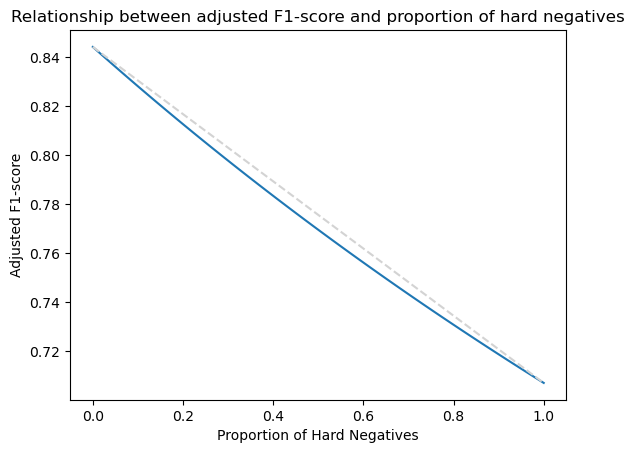

In [118]:
import math
prop = np.linspace(0, 1, 50)

tnr_weighted = (1-prop)*tnr_easy + prop*tnr_hard

TP = tpr * agg_positives_total.sum()
FN = (1-tpr) * agg_positives_total.sum()
# FP_weighted = (1-tnr_weighted) * (agg_hard_negatives_total.sum() + agg_easy_negatives_total.sum())

num_negs = (agg_hard_negatives_total.sum() + agg_easy_negatives_total.sum())/2 # For interpretability, we take arithmetic mean.
# num_negs = math.sqrt(agg_hard_negatives_total.sum() * agg_easy_negatives_total.sum())
# num_negs = 2/(1/agg_hard_negatives_total.sum() + 1/agg_easy_negatives_total.sum())
print(num_negs)
FP_weighted = (1-tnr_weighted) * (num_negs)
FP_easy = (1-tnr_easy) * agg_easy_negatives_total.sum()
FP_hard = (1-tnr_hard) * agg_hard_negatives_total.sum()
f1_weighted = TP/(TP+0.5*(FN+FP_weighted))
f1_easy = TP/(TP+0.5*(FN+FP_easy))
f1_hard = TP/(TP+0.5*(FN+FP_hard))


import matplotlib.pyplot as plt
plt.plot(prop,f1_weighted)
plt.plot(prop[[0,-1]], f1_weighted[[0,-1]], '--', c='lightgray')
plt.xlabel('Proportion of Hard Negatives')
plt.ylabel('Adjusted F1-score')
plt.title('Relationship between adjusted F1-score and proportion of hard negatives')


11. Qualitative Error Analysis for Task 1

In [ ]:
agg_positives_wrong = agg_positives_total - agg_positives_correct
agg_positives_wrong = agg_positives_wrong/agg_positives_wrong.max() > 0.5
wrong_positive_indices = np.stack(np.nonzero(agg_positives_wrong)).transpose() # easier to view
print(wrong_positive_indices)
# View errors:
for (i,j) in wrong_positive_indices:
    print(f"Story: {new_bigtom.iloc[i]['Story - Context']} {new_bigtom.iloc[i]['Story - Desire']}")
    print(f"Event: {new_bigtom.iloc[i]['Story - An external event']}")
    print(f"Belief: {new_bigtom.iloc[i]['Story - Belief']}")
    print(labelled_percepts.iloc[i][f'{senses[j]}_pos'])
    print('\n\n')
# labelled_percepts
# print(wrong_positive_indices.shape)
for i in range(8):
    print((wrong_positive_indices == i).sum())

#            prompt = f"Story: {new_bigtom.iloc[i]['Story - Context']} {new_bigtom.iloc[i]['Story - Desire']} {new_bigtom.iloc[i]['Story - Perception cues']} \n\n"
#            prompt += f"Event: {new_bigtom.iloc[i]['Story - An external event']}\n\n"

In [ ]:
agg_hard_negatives_wrong = agg_hard_negatives_total - agg_hard_negatives_correct
agg_hard_negatives_wrong = agg_hard_negatives_wrong/agg_hard_negatives_wrong.max() > 0.5
wrong_hard_negatives_indices = np.stack(np.nonzero(agg_hard_negatives_wrong)).transpose() # easier to view
# print(wrong_hard_negatives_indices)
# View errors:
for (i,j) in wrong_hard_negatives_indices:
    print(f"Story: {new_bigtom.iloc[i]['Story - Context']} {new_bigtom.iloc[i]['Story - Desire']}")
    print(f"Event: {new_bigtom.iloc[i]['Story - An external event']}")
    print(f"Belief: {new_bigtom.iloc[i]['Story - Belief']}")
    print(labelled_percepts.iloc[i][f'{senses[j]}_hard_neg'])
    print('\n\n')
# labelled_percepts
print(wrong_hard_negatives_indices.shape)
# for i in range(8):
#     print((wrong_positive_indices == i).sum())

#            prompt = f"Story: {new_bigtom.iloc[i]['Story - Context']} {new_bigtom.iloc[i]['Story - Desire']} {new_bigtom.iloc[i]['Story - Perception cues']} \n\n"
#            prompt += f"Event: {new_bigtom.iloc[i]['Story - An external event']}\n\n"

12. Code for Task 2

In [16]:
# we do 3 samples
reps = 3 # number of repetitions
task_2_alt_positives_correct = np.zeros((num_stories, num_senses,reps))
task_2_alt_positives_total = np.zeros((num_stories, num_senses,reps))

In [18]:
import random
# positives
count = 0
input_tokens = 0
output_tokens = 0
begin = time.time()

for rep in range(reps):
    for i in range(num_stories): # set to 100 later
        print(f'{i}-th story')
        
        for col in positives[i].keys():
            if str(positives[i][col]) == 'nan':
                continue
            
            count += 1
            
            for k in range(2): # pos/neg
                random.seed(count)
                print("Generating:", count, "-th prompt")
                # prompt = f"Story: {new_bigtom.iloc[i]['Story - Context']} {new_bigtom.iloc[i]['Story - Desire']} {new_bigtom.iloc[i]['Story - Perception cues']} {new_bigtom.iloc[i]['Story - Belief']}\n\n"
                prompt = f"Story: {new_bigtom.iloc[i]['Story - Context']} {new_bigtom.iloc[i]['Story - Desire']} {new_bigtom.iloc[i]['Story - Perception cues']} \n\n"
                prompt += f"Event: {new_bigtom.iloc[i]['Story - An external event']}\n\n"
                prompt += f"Regarding the event, the main character {protag_name[i]} only encounters the following percepts: \n 1. {positives[i][col]} \n 2. {random.choice(list(easy_negatives[i].values()))} \n\n"
                # prompt += f"Instructions: Select the most appropriate answer to the following question: "
                # prompt += f"before the event, {protag_name[i]}'s initial belief was {new_bigtom.iloc[i]['Story - Belief']}. "
                # prompt += f"Does {protag_name[i]} maintain this initial belief after the event? Answer 'Yes' or 'No':\n\n"
                # prompt += f"A. {protag_name[i]} maintains their initial belief \nB. {protag_name[i]} changes their belief \n"
                # prompt += f"before the event, {protag_name[i]}\'s belief was \"{new_bigtom.iloc[i]['Story - Belief']}\". "
                # prompt += f"Did the event cause {protag_name[i]} to change this belief? \n"
                # prompt += f"Answers: A. No \nB. Yes"
                # prompt += f"Based on the story and the event, choose the answer option that best describes {protag_name[i]}\'s belief AFTER the event: \n"
                # prompt += f"A. {new_bigtom.iloc[i]['Story - Belief']} \n"
                # prompt += f"B. {new_bigtom.iloc[i]['Story - Belief']}"
                
                
                prompt += f"Before the event, the main character's initial belief was {new_bigtom.iloc[i]['Story - Belief']} "
                prompt += f"Instructions: Analyze the situation and select the most appropriate answer to the following question: "
                prompt += f"Did the event cause the main character {protag_name[i]} to change their belief?"
                if k == 0:
                    prompt += f"A. No\nB. Yes"
                elif k == 1:
                    prompt += f"A. Yes\nB. No"              

                input_tokens += count_tokens(prompt)
                # print("input tokens = ", count_tokens(prompt), ". price (USD) is ", count_tokens(prompt)*30/1000000)
                print(prompt)
                for _ in range(1): # generate 5 outputs. 
                    print("iteration ")
                    output = LM_generation(prompt, temperature = 0, max_tokens = 3, model = "gpt-4")
                    print('output: ', output)
                    model_answer = output[0][0]
                    if k == 0:
                        actual_answer = 'B' # positives
                        # actual_answer = 'A' # negatives
                    elif k == 1:
                        actual_answer = 'A' # positives
                        # actual_answer = 'B' # negatives
                        
                    
                    task_2_alt_positives_total[i, sense_dict[col], rep] += 1
                    task_2_alt_positives_correct[i, sense_dict[col], rep] += int(model_answer == actual_answer)
                    
                    output_tokens += count_tokens(output[0])
                    np.save('task_2_alt_positives_correct.npy', task_2_alt_positives_correct)
                    np.save('task_2_alt_positives_total.npy', task_2_alt_positives_total)
                    # print("output tokens = ", count_tokens(output[0]), ". price (USD) is ", count_tokens(output[0])*60/1000000)
                    
        if i % 5 == 0:
            end = time.time()
            print(f'Time taken for these 5 stories: {end-begin} seconds.')
            begin = time.time()


print("input tokens = ", input_tokens, ". price (USD) is ", input_tokens*30/1000000)
print("output tokens = ", output_tokens, ". price (USD) is ", output_tokens*60/1000000)

print('Number of Questions: ', task_2_alt_positives_total.sum())
print('Number of Questions (Sanity Check): ', 2*count)
print('accuracy: ', task_2_alt_positives_correct.sum()/task_2_alt_positives_total.sum()) # this is the mean.



0-th story
Generating: 1 -th prompt
Story: Noor is working as a barista at a busy coffee shop.  Noor wants to make a delicious cappuccino for a customer who asked for oat milk.  Noor grabs a milk pitcher and fills it with oat milk. 

Event:  A coworker, who didn't hear the customer's request, swaps the oat milk in the pitcher with almond milk while Noor is attending to another task.

Regarding the event, the main character Noor only encounters the following percepts: 
 1. As Noor pours the milk into the espresso, she notices the liquid's texture. Instead of the familiar creamy, smooth flow that oat milk typically has, the milk appears slightly more translucent, with a thinner consistency that swirls differently in the cup, creating delicate, lacy patterns. 
 2. As the mug shatters, a waft of freshly ground coffee beans mingles with the scent of warm pastries from the bakery case. The rich aroma envelops Noor, intertwining with the faint, nutty sweetness of the oat milk, creating an inv

In [20]:
task_2_positives_correct = np.zeros((num_stories, num_senses,reps))
task_2_positives_total = np.zeros((num_stories, num_senses,reps))

In [ ]:
# positives
count = 0
input_tokens = 0
output_tokens = 0
begin = time.time()

for rep in range(reps):
    for i in range(num_stories): # set to 100 later
        print(f'{i}-th story')
        for col in positives[i].keys():
            if str(positives[i][col]) == 'nan':
                continue
            count += 1
            for k in range(2): # pos/neg
                random.seed(count)
                print("Generating:", count, "-th prompt")
                # prompt = f"Story: {new_bigtom.iloc[i]['Story - Context']} {new_bigtom.iloc[i]['Story - Desire']} {new_bigtom.iloc[i]['Story - Perception cues']} {new_bigtom.iloc[i]['Story - Belief']}\n\n"
                prompt = f"Story: {new_bigtom.iloc[i]['Story - Context']} {new_bigtom.iloc[i]['Story - Desire']} {new_bigtom.iloc[i]['Story - Perception cues']} \n\n"
                prompt += f"Event: {new_bigtom.iloc[i]['Story - An external event']}\n\n"
                prompt += f"Regarding the event, the main character {protag_name[i]} only encounters the following percepts: \n 1. {positives[i][col]} \n 2. {random.choice(list(easy_negatives[i].values()))} \n\n"
                # prompt += f"Instructions: Select the most appropriate answer to the following question: "
                # prompt += f"before the event, {protag_name[i]}'s initial belief was {new_bigtom.iloc[i]['Story - Belief']}. "
                # prompt += f"Does {protag_name[i]} maintain this initial belief after the event? Answer 'Yes' or 'No':\n\n"
                # prompt += f"A. {protag_name[i]} maintains their initial belief \nB. {protag_name[i]} changes their belief \n"
                # prompt += f"before the event, {protag_name[i]}\'s belief was \"{new_bigtom.iloc[i]['Story - Belief']}\". "
                # prompt += f"Did the event cause {protag_name[i]} to change this belief? \n"
                # prompt += f"Answers: A. No \nB. Yes"
                # prompt += f"Based on the story and the event, choose the answer option that best describes {protag_name[i]}\'s belief AFTER the event: \n"
                # prompt += f"A. {new_bigtom.iloc[i]['Story - Belief']} \n"
                # prompt += f"B. {new_bigtom.iloc[i]['Story - Belief']}"
                
                
                prompt += f"Before the event, the main character's initial belief was {new_bigtom.iloc[i]['Story - Belief']} "
                prompt += f"Instructions: Analyze the situation and select the most appropriate answer to the following question: "

                prompt += f"After the event happened, based on the main character's perception of the event, is the following statement about {protag_name[i]}'s belief True or False: \n"
                prompt += f"Statement: \"{new_bigtom.iloc[i]['Story - Belief']}\""
                if k == 0:
                    prompt += f"A. True\nB. False"
                elif k == 1:
                    prompt += f"A. False\nB. True"              

                input_tokens += count_tokens(prompt)
                # print("input tokens = ", count_tokens(prompt), ". price (USD) is ", count_tokens(prompt)*30/1000000)
                print(prompt)
                for _ in range(1): # generate 3 outputs. 
                    print("iteration ")
                    output = LM_generation(prompt, temperature = 0, max_tokens = 3, model = "gpt-4")
                    print('output: ', output)
                    model_answer = output[0][0]
                    if k == 0:
                        actual_answer = 'B' # positives
                        # actual_answer = 'A' # negatives
                    elif k == 1:
                        actual_answer = 'A' # positives
                        # actual_answer = 'B' # negatives
                        
                    
                    task_2_positives_total[i, sense_dict[col], rep] += 1
                    task_2_positives_correct[i, sense_dict[col], rep] += int(model_answer == actual_answer)
                    
                    output_tokens += count_tokens(output[0])
                    np.save('task_2_positives_correct.npy', task_2_positives_correct)
                    np.save('task_2_positives_total.npy', task_2_positives_total)
                    # print("output tokens = ", count_tokens(output[0]), ". price (USD) is ", count_tokens(output[0])*60/1000000)
                    
        if i % 5 == 0:
            end = time.time()
            print(f'Time taken for these 5 stories: {end-begin} seconds.')
            begin = time.time()


print("input tokens = ", input_tokens, ". price (USD) is ", input_tokens*30/1000000)
print("output tokens = ", output_tokens, ". price (USD) is ", output_tokens*60/1000000)

print('Number of Questions: ', task_2_positives_total.sum())
print('Number of Questions (Sanity Check): ', 2*count)
print('accuracy: ', task_2_positives_correct.sum()/task_2_positives_total.sum())



0-th story
Generating: 1 -th prompt
Story: Noor is working as a barista at a busy coffee shop.  Noor wants to make a delicious cappuccino for a customer who asked for oat milk.  Noor grabs a milk pitcher and fills it with oat milk. 

Event:  A coworker, who didn't hear the customer's request, swaps the oat milk in the pitcher with almond milk while Noor is attending to another task.

Regarding the event, the main character Noor only encounters the following percepts: 
 1. As Noor pours the milk into the espresso, she notices the liquid's texture. Instead of the familiar creamy, smooth flow that oat milk typically has, the milk appears slightly more translucent, with a thinner consistency that swirls differently in the cup, creating delicate, lacy patterns. 
 2. As the mug shatters, a waft of freshly ground coffee beans mingles with the scent of warm pastries from the bakery case. The rich aroma envelops Noor, intertwining with the faint, nutty sweetness of the oat milk, creating an inv

In [20]:
reps = 3
task_2_hard_negatives_correct = np.zeros((num_stories, num_senses,reps))
task_2_hard_negatives_total = np.zeros((num_stories, num_senses,reps))

In [21]:
import random
count = 0
input_tokens = 0
output_tokens = 0
begin = time.time()

for rep in range(reps):
    for i in range(100): # set to 100 later
        print(f'{i}-th story')
        for col in hard_negatives[i].keys():
            if str(hard_negatives[i][col]) == 'nan':
                continue
            count += 1
            for k in range(2): # pos/neg
                random.seed(count)
                print("Generating:", count, "-th prompt")
                # prompt = f"Story: {new_bigtom.iloc[i]['Story - Context']} {new_bigtom.iloc[i]['Story - Desire']} {new_bigtom.iloc[i]['Story - Perception cues']} {new_bigtom.iloc[i]['Story - Belief']}\n\n"
                prompt = f"Story: {new_bigtom.iloc[i]['Story - Context']} {new_bigtom.iloc[i]['Story - Desire']} {new_bigtom.iloc[i]['Story - Perception cues']} \n\n"
                prompt += f"Event: {new_bigtom.iloc[i]['Story - An external event']}\n\n"
                # prompt += f"Regarding the event, the main character {protag_name[i]} only encounters the following percept, and nothing else: {hard_negatives[i][col]}\n\n"
                prompt += f"Regarding the event, the main character {protag_name[i]} only encounters the following percepts, and nothing else: \n 1. {hard_negatives[i][col]} \n 2. {random.choice(list(easy_negatives[i].values()))} \n\n"
                # prompt += f"Instructions: Select the most appropriate answer to the following question: "
                # prompt += f"before the event, {protag_name[i]}'s initial belief was {new_bigtom.iloc[i]['Story - Belief']}. "
                # prompt += f"Does {protag_name[i]} maintain this initial belief after the event? Answer 'Yes' or 'No':\n\n"
                # prompt += f"A. {protag_name[i]} maintains their initial belief \nB. {protag_name[i]} changes their belief \n"
                # prompt += f"before the event, {protag_name[i]}\'s belief was \"{new_bigtom.iloc[i]['Story - Belief']}\". "
                # prompt += f"Did the event cause {protag_name[i]} to change this belief? \n"
                # prompt += f"Answers: A. No \nB. Yes"
                # prompt += f"Based on the story and the event, choose the answer option that best describes {protag_name[i]}\'s belief AFTER the event: \n"
                # prompt += f"A. {new_bigtom.iloc[i]['Story - Belief']} \n"
                # prompt += f"B. {new_bigtom.iloc[i]['Story - Belief']}"
                
                
                prompt += f"Before the event, the main character's initial belief was {new_bigtom.iloc[i]['Story - Belief']} "
                prompt += f"Instructions: Analyze the situation and select the most appropriate answer to the following question: "

                prompt += f"After the event happened, based on the main character's perception of the event, is the following statement about {protag_name[i]}'s belief True or False: \n"
                prompt += f"Statement: \"{new_bigtom.iloc[i]['Story - Belief']}\""
                if k == 0:
                    prompt += f"A. True\nB. False"
                else:
                    prompt += f"A. False\nB. True"              

                input_tokens += count_tokens(prompt)
                # print("input tokens = ", count_tokens(prompt), ". price (USD) is ", count_tokens(prompt)*30/1000000)
                print(prompt)
                for _ in range(1): # generate 3 outputs. 
                    print("iteration ")
                    output = LM_generation(prompt, temperature = 0, max_tokens = 3, model = "gpt-4")
                    print('output: ', output)
                    model_answer = output[0][0]
                    if k == 0:
                        # actual_answer = 'B' # positives
                        actual_answer = 'A' # negatives
                    else:
                        # actual_answer = 'A' # positives
                        actual_answer = 'B' # negatives
                        
                    
                    task_2_hard_negatives_total[i, sense_dict[col],rep] += 1
                    task_2_hard_negatives_correct[i, sense_dict[col],rep] += int(model_answer == actual_answer)
                    
                    output_tokens += count_tokens(output[0])
                    np.save('task_2_hard_negatives_correct.npy', task_2_hard_negatives_correct)
                    np.save('task_2_hard_negatives_total.npy', task_2_hard_negatives_total)
                    # print("output tokens = ", count_tokens(output[0]), ". price (USD) is ", count_tokens(output[0])*60/1000000)
                    
        if i % 5 == 0:
            end = time.time()
            print(f'Time taken for these 5 stories: {end-begin} seconds.')
            begin = time.time()


print("input tokens = ", input_tokens, ". price (USD) is ", input_tokens*30/1000000)
print("output tokens = ", output_tokens, ". price (USD) is ", output_tokens*60/1000000)

print('Number of Questions: ', task_2_hard_negatives_total.sum())
print('Number of Questions (Sanity Check): ', 2*count)
print('accuracy: ', task_2_hard_negatives_correct.sum()/task_2_hard_negatives_total.sum())



0-th story
Generating: 1 -th prompt
Story: Noor is working as a barista at a busy coffee shop.  Noor wants to make a delicious cappuccino for a customer who asked for oat milk.  Noor grabs a milk pitcher and fills it with oat milk. 

Event:  A coworker, who didn't hear the customer's request, swaps the oat milk in the pitcher with almond milk while Noor is attending to another task.

Regarding the event, the main character Noor only encounters the following percepts, and nothing else: 
 1. A bright green label on the milk carton nearby suddenly catches Noor’s eye, glistening under the café's overhead lights. The bold print reads “Almond Milk” in a slightly whimsical font. 
 2. As the mug shatters, a waft of freshly ground coffee beans mingles with the scent of warm pastries from the bakery case. The rich aroma envelops Noor, intertwining with the faint, nutty sweetness of the oat milk, creating an inviting yet chaotic olfactory landscape. 

Before the event, the main character's initia

In [18]:
task_2_alt_hard_negatives_correct = np.zeros((num_stories, num_senses,reps))
task_2_alt_hard_negatives_total = np.zeros((num_stories, num_senses,reps))

In [19]:
# alt_hard_negatives
count = 0
input_tokens = 0
output_tokens = 0
begin = time.time()

for rep in range(reps):
    for i in range(num_stories): # set to 100 later
        print(f'{i}-th story')
        for col in hard_negatives[i].keys():
            if str(hard_negatives[i][col]) == 'nan':
                continue
            count += 1
            for k in range(2): # pos/neg
                print("Generating:", count, "-th prompt")
                # prompt = f"Story: {new_bigtom.iloc[i]['Story - Context']} {new_bigtom.iloc[i]['Story - Desire']} {new_bigtom.iloc[i]['Story - Perception cues']} {new_bigtom.iloc[i]['Story - Belief']}\n\n"
                prompt = f"Story: {new_bigtom.iloc[i]['Story - Context']} {new_bigtom.iloc[i]['Story - Desire']} {new_bigtom.iloc[i]['Story - Perception cues']} \n\n"
                prompt += f"Event: {new_bigtom.iloc[i]['Story - An external event']}\n\n"
                # prompt += f"Regarding the event, the main character {protag_name[i]} only encounters the following percept, and nothing else: {hard_negatives[i][col]}\n\n"
                prompt += f"Regarding the event, the main character {protag_name[i]} only encounters the following percepts, and nothing else: \n 1. {hard_negatives[i][col]} \n 2. {random.choice(list(easy_negatives[i].values()))} \n\n"
                # prompt += f"Instructions: Select the most appropriate answer to the following question: "
                # prompt += f"before the event, {protag_name[i]}'s initial belief was {new_bigtom.iloc[i]['Story - Belief']}. "
                # prompt += f"Does {protag_name[i]} maintain this initial belief after the event? Answer 'Yes' or 'No':\n\n"
                # prompt += f"A. {protag_name[i]} maintains their initial belief \nB. {protag_name[i]} changes their belief \n"
                # prompt += f"before the event, {protag_name[i]}\'s belief was \"{new_bigtom.iloc[i]['Story - Belief']}\". "
                # prompt += f"Did the event cause {protag_name[i]} to change this belief? \n"
                # prompt += f"Answers: A. No \nB. Yes"
                # prompt += f"Based on the story and the event, choose the answer option that best describes {protag_name[i]}\'s belief AFTER the event: \n"
                # prompt += f"A. {new_bigtom.iloc[i]['Story - Belief']} \n"
                # prompt += f"B. {new_bigtom.iloc[i]['Story - Belief']}"
                
                
                prompt += f"Before the event, the main character's initial belief was {new_bigtom.iloc[i]['Story - Belief']} "
                prompt += f"Instructions: Analyze the situation and select the most appropriate answer to the following question: "
                prompt += f"Did the event cause the main character {protag_name[i]} to change their belief?"
                if k == 0:
                    prompt += f"A. No\nB. Yes"
                elif k == 1:
                    prompt += f"A. Yes\nB. No"              

                input_tokens += count_tokens(prompt)
                # print("input tokens = ", count_tokens(prompt), ". price (USD) is ", count_tokens(prompt)*30/1000000)
                print(prompt)
                for _ in range(1): # generate 3 outputs. 
                    print("iteration ")
                    output = LM_generation(prompt, temperature = 0, max_tokens = 3, model = "gpt-4")
                    print('output: ', output)
                    model_answer = output[0][0]
                    if k == 0:
                        # actual_answer = 'B' # positives
                        actual_answer = 'A' # negatives
                    elif k == 1:
                        # actual_answer = 'A' # positives
                        actual_answer = 'B' # negatives
                        
                    
                    task_2_alt_hard_negatives_total[i, sense_dict[col], rep] += 1
                    task_2_alt_hard_negatives_correct[i, sense_dict[col], rep] += int(model_answer == actual_answer)
                    
                    output_tokens += count_tokens(output[0])
                    np.save('task_2_alt_hard_negatives_correct.npy', task_2_alt_hard_negatives_correct)
                    np.save('task_2_alt_hard_negatives_total.npy', task_2_alt_hard_negatives_total)
                    # print("output tokens = ", count_tokens(output[0]), ". price (USD) is ", count_tokens(output[0])*60/1000000)
                    
        if i % 5 == 0:
            end = time.time()
            print(f'Time taken for these 5 stories: {end-begin} seconds.')
            begin = time.time()


print("input tokens = ", input_tokens, ". price (USD) is ", input_tokens*30/1000000)
print("output tokens = ", output_tokens, ". price (USD) is ", output_tokens*60/1000000)

print('Number of Questions: ', task_2_alt_hard_negatives_total.sum())
print('Number of Questions (Sanity Check): ', 2*count)
print('accuracy: ', task_2_alt_hard_negatives_correct.sum()/task_2_alt_hard_negatives_total.sum())



0-th story
Generating: 1 -th prompt
Story: Noor is working as a barista at a busy coffee shop.  Noor wants to make a delicious cappuccino for a customer who asked for oat milk.  Noor grabs a milk pitcher and fills it with oat milk. 

Event:  A coworker, who didn't hear the customer's request, swaps the oat milk in the pitcher with almond milk while Noor is attending to another task.

Regarding the event, the main character Noor only encounters the following percepts, and nothing else: 
 1. A bright green label on the milk carton nearby suddenly catches Noor’s eye, glistening under the café's overhead lights. The bold print reads “Almond Milk” in a slightly whimsical font. 
 2. The taste of the air shifts as a hint of spilled coffee drips from the counter, its bitter notes contrasting with the creamy sweetness of the oat milk. The residual flavors of caramel and chocolate linger on Noor’s tongue, a reminder of the last cappuccino she crafted moments before the mug fell. 

Before the eve

13. Calculate the True Positive Rate, True Negative Rate, and F1-score for Task 2

In [167]:
task_2_hard_negatives_total = np.load('task_2_hard_negatives_total.npy')
task_2_alt_hard_negatives_total = np.load('task_2_alt_hard_negatives_total.npy')
task_2_hard_negatives_correct = np.load('task_2_hard_negatives_correct.npy')
task_2_alt_hard_negatives_correct = np.load('task_2_alt_hard_negatives_correct.npy')

task_2_positives_total = np.load('task_2_positives_total.npy')
task_2_alt_positives_total = np.load('task_2_alt_positives_total.npy')
task_2_positives_correct = np.load('task_2_positives_correct.npy')
task_2_alt_positives_correct = np.load('task_2_alt_positives_correct.npy')

task_2_agg_positives_total = task_2_positives_total + task_2_alt_positives_total
task_2_agg_positives_correct = task_2_positives_correct + task_2_alt_positives_correct
task_2_agg_hard_negatives_total = task_2_hard_negatives_total + task_2_alt_hard_negatives_total
task_2_agg_hard_negatives_correct = task_2_hard_negatives_correct + task_2_alt_hard_negatives_correct

print(task_2_agg_positives_total.sum())
print(task_2_agg_positives_correct.sum())
print(task_2_agg_hard_negatives_total.sum())
print(task_2_agg_hard_negatives_correct.sum())

4756.0
4159.0
1980.0
818.0


In [161]:
print(task_2_agg_positives_total.shape)
task_2_tpr = task_2_agg_positives_correct.sum(axis = 0)/task_2_agg_positives_total.sum(axis=0) # true positive rate
task_2_tnr = task_2_agg_hard_negatives_correct.sum(axis=0)/task_2_agg_hard_negatives_total.sum(axis=0)
task_2_tpr_mean = task_2_tpr.mean(axis=-1)
task_2_tpr_std = task_2_tpr.std(axis=-1)
task_2_tnr_mean = task_2_tnr.mean(axis=-1)
task_2_tnr_std = task_2_tnr.std(axis=-1)
print("TPR", task_2_tpr_mean, task_2_tpr_std )
print("TNR", task_2_tnr_mean, task_2_tnr_std)
# print('Task 2 True positive rate: ', task_2_tpr)
# print('Task 2 True negative rate (hard negatives only): ', task_2_tnr)
# print('Task 1 True positive rate: ', tpr)
# print('Task 1 True negative rate (hard negatives only): ', tnr_hard)

(100, 8, 3)
TPR [0.91969896 0.89875785 0.86163522 0.86666667 0.92910448 0.85185185
 0.85683761 0.71705426] [0.00840845 0.00965277 0.018201   0.01699673 0.00609326 0.01512031
 0.01838104 0.01194654]
TNR [0.26470588 0.51388889 0.50396825 0.41666667 0.34259259 0.24666667
 0.3627451  0.51944444] [0.0120073  0.02389535 0.01484785 0.02946278 0.01309457 0.00471405
 0.0567443  0.01039349]


In [162]:


task_2_TP = task_2_tpr * task_2_agg_positives_total.sum()
task_2_FN = (1-task_2_tpr) * task_2_agg_positives_total.sum()


task_2_FP = (1-tnr_hard) * task_2_agg_hard_negatives_total.sum()
task_2_f1_score = task_2_TP/(task_2_TP+0.5*(task_2_FN+task_2_FP))

print(task_2_f1_score.mean(axis=-1), task_2_f1_score.std(axis=-1))


[0.85079974 0.83955322 0.81901315 0.82184233 0.855786   0.81352217
 0.81631114 0.73191184] [0.00446224 0.00523655 0.01016733 0.00945542 0.00321096 0.00856733
 0.0103816  0.00772101]


14. Qualitative Error Analysis for Task 2

In [ ]:
agg_positives_task_1_good = agg_positives_correct/agg_positives_total.max() > 0.5
agg_positives_task_2_bad = ((task_2_agg_positives_total.mean(axis=-1)-task_2_agg_positives_correct.mean(axis=-1))/task_2_agg_positives_total.max()) >= 0.5
wrong_positive_indices_task_2 = np.stack(np.nonzero(np.logical_and(agg_positives_task_1_good, agg_positives_task_2_bad))).transpose() # easier to view
print(wrong_positive_indices_task_2)
for (i,j) in wrong_positive_indices_task_2:
    print(f"Story: {new_bigtom.iloc[i]['Story - Context']} {new_bigtom.iloc[i]['Story - Desire']}")
    print(f"Event: {new_bigtom.iloc[i]['Story - An external event']}")
    print(f"Belief: {new_bigtom.iloc[i]['Story - Belief']}")
    print(labelled_percepts.iloc[i][f'{senses[j]}_pos'])
    print('\n\n')
# labelled_percepts
# print(wrong_hard_negatives_indices.shape)
# for i in range(8):
#     print((wrong_positive_indices == i).sum())

#            prompt = f"Story: {new_bigtom.iloc[i]['Story - Context']} {new_bigtom.iloc[i]['Story - Desire']} {new_bigtom.iloc[i]['Story - Perception cues']} \n\n"
#            prompt += f"Event: {new_bigtom.iloc[i]['Story - An external event']}\n\n"